# DYNAMIC PRICING STRATEGY

In [ ]:
# importing all the required packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from ydata_profiling import ProfileReport

In [ ]:
#Reads a CSV file named "adjusted_online_retail_2022_last_6_months 2.csv" into a Pandas DataFrame and assigns it to the variable 'data'.
data = pd.read_csv("/content/adjusted_online_retail_2022_last_6_months.csv")

In [ ]:
#Displays the first few rows of the DataFrame 'data' to provide a preview of its contents.
data.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,TotalPrice
0,514217,20658,RED SPOTTY LUGGAGE TAG,12,2022-07-01 08:39:00,1.25,17029.0,United Kingdom,15.00
1,514217,21155,RED SPOTTY PEG BAG,6,2022-07-01 08:39:00,2.10,17029.0,United Kingdom,12.60
2,514217,21035,SET/2 RED SPOTTY TEA TOWELS,6,2022-07-01 08:39:00,2.95,17029.0,United Kingdom,17.70
3,514217,21498,RED SPOTS WRAP,25,2022-07-01 08:39:00,0.42,17029.0,United Kingdom,10.50
4,514217,21936,RED RETROSPOT PICNIC BAG,5,2022-07-01 08:39:00,2.95,17029.0,United Kingdom,14.75


# DATA PREPROCESSING

In [ ]:
# Convert InvoiceDate to datetime format
data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])

In [ ]:
#Extracts the day of the week from the 'InvoiceDate' column and assigns it to a new column 'DayOfWeek'
data['DayOfWeek'] = data['InvoiceDate'].dt.day_name()
# Extracts the month from the 'InvoiceDate' column and assigns it to a new column 'Month'
data['Month'] = data['InvoiceDate'].dt.month
#Converts the 'InvoiceDate' column to year-month period format and assigns it to a new column 'YearMonth'
data['YearMonth'] = data['InvoiceDate'].dt.to_period('M')

# Simplified region mapping (expand as needed)
regions = {
    'United Kingdom': 'Europe',
    'Spain': 'Europe',
    # Add more mappings here
}
data['CountryRegion'] = data['Country'].map(regions)
data['DayOfMonth'] = data['InvoiceDate'].dt.day
data['WeekOfYear'] = data['InvoiceDate'].dt.isocalendar().week

In [ ]:
# Defines the bins for price ranges
bins = [0, 5, 10, np.inf]
# Defines the labels for price ranges
labels = ['Low', 'Medium', 'High']
# Categorizes prices into price ranges and assigns the labels to a new column 'PriceRange'
data['PriceRange'] = pd.cut(data['Price'], bins=bins, labels=labels, right=False)


In [ ]:
data.info() ## Provides information about the DataFrame 'data', including the index dtype, column dtypes, non-null values, and memory usage.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216928 entries, 0 to 216927
Data columns (total 16 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Invoice        216928 non-null  object        
 1   StockCode      216928 non-null  object        
 2   Description    216928 non-null  object        
 3   Quantity       216928 non-null  int64         
 4   InvoiceDate    216928 non-null  datetime64[ns]
 5   Price          216928 non-null  float64       
 6   Customer ID    216928 non-null  float64       
 7   Country        216928 non-null  object        
 8   TotalPrice     216928 non-null  float64       
 9   DayOfWeek      216928 non-null  object        
 10  Month          216928 non-null  int32         
 11  YearMonth      216928 non-null  period[M]     
 12  CountryRegion  196978 non-null  object        
 13  DayOfMonth     216928 non-null  int32         
 14  WeekOfYear     216928 non-null  UInt32        
 15  

In [ ]:
data.shape # Retrieves the shape of the DataFrame 'data', which represents the number of rows and columns.

(216928, 16)

In [ ]:
data.dtypes # Displays the data types of each column in the DataFrame 'data'.

Invoice                  object
StockCode                object
Description              object
Quantity                  int64
InvoiceDate      datetime64[ns]
Price                   float64
Customer ID             float64
Country                  object
TotalPrice              float64
DayOfWeek                object
Month                     int32
YearMonth             period[M]
CountryRegion            object
DayOfMonth                int32
WeekOfYear               UInt32
PriceRange             category
dtype: object

In [ ]:
# Calculates the sum of missing values for each column in the DataFrame 'data'.
data.isnull().sum()

Invoice              0
StockCode            0
Description          0
Quantity             0
InvoiceDate          0
Price                0
Customer ID          0
Country              0
TotalPrice           0
DayOfWeek            0
Month                0
YearMonth            0
CountryRegion    19950
DayOfMonth           0
WeekOfYear           0
PriceRange           0
dtype: int64

In [ ]:
#Generates descriptive statistics for numerical columns in the DataFrame 'data' and transposes the result for better readability.
data.describe().T

,count,mean,min,25%,50%,75%,max,std
Quantity,216928.0,12.045066,-9360.0,2.0,5.0,12.0,9360.0,87.32137
InvoiceDate,216928,2022-10-04 16:03:54.076836608,2022-07-01 08:39:00,2022-08-31 13:57:00,2022-10-12 13:54:00,2022-11-11 16:55:00,2022-12-09 20:01:00,NaN
Price,216928.0,3.634979,0.0,1.25,1.95,3.75,10468.8,50.405829
Customer ID,216928.0,15385.475964,12346.0,14016.0,15382.0,16799.0,18287.0,1682.859804
TotalPrice,216928.0,19.986208,-10468.8,4.2,10.5,18.6,15818.4,91.8176
Month,216928.0,9.624705,7.0,8.0,10.0,11.0,12.0,1.49219
DayOfMonth,216928.0,15.396509,1.0,8.0,15.0,23.0,31.0,8.848794
WeekOfYear,216928.0,39.813569,26.0,35.0,41.0,45.0,49.0,6.497564


In [ ]:
#Fills missing values in the 'CountryRegion' column with the value 'Other' and modifies the DataFrame in place.
data['CountryRegion'].fillna('Other', inplace=True)

In [ ]:
data = data[data['Quantity'] >= 0] # Filters the DataFrame 'data' to retain only rows where the 'Quantity' column is greater than or equal to zero.

In [ ]:
data.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,TotalPrice,DayOfWeek,Month,YearMonth,CountryRegion,DayOfMonth,WeekOfYear,PriceRange
0,514217,20658,RED SPOTTY LUGGAGE TAG,12,2022-07-01 08:39:00,1.25,17029.0,United Kingdom,15.00,Friday,7,2022-07,Europe,1,26,Low
1,514217,21155,RED SPOTTY PEG BAG,6,2022-07-01 08:39:00,2.10,17029.0,United Kingdom,12.60,Friday,7,2022-07,Europe,1,26,Low
2,514217,21035,SET/2 RED SPOTTY TEA TOWELS,6,2022-07-01 08:39:00,2.95,17029.0,United Kingdom,17.70,Friday,7,2022-07,Europe,1,26,Low
3,514217,21498,RED SPOTS WRAP,25,2022-07-01 08:39:00,0.42,17029.0,United Kingdom,10.50,Friday,7,2022-07,Europe,1,26,Low
4,514217,21936,RED RETROSPOT PICNIC BAG,5,2022-07-01 08:39:00,2.95,17029.0,United Kingdom,14.75,Friday,7,2022-07,Europe,1,26,Low


In [ ]:
data.describe().T

,count,mean,min,25%,50%,75%,max,std
Quantity,212412.0,13.002076,1.0,2.0,5.0,12.0,9360.0,75.948546
InvoiceDate,212412,2022-10-04 18:07:16.417716736,2022-07-01 08:39:00,2022-08-31 15:05:15,2022-10-12 15:04:00,2022-11-11 17:55:00,2022-12-09 20:01:00,NaN
Price,212412.0,3.195081,0.0,1.25,1.95,3.75,10468.8,28.723757
Customer ID,212412.0,15393.169157,12347.0,14030.0,15406.0,16814.0,18287.0,1681.451005
TotalPrice,212412.0,21.413048,0.0,4.35,11.7,19.5,15818.4,80.915257
Month,212412.0,9.627323,7.0,8.0,10.0,11.0,12.0,1.491156
DayOfMonth,212412.0,15.402218,1.0,8.0,15.0,23.0,31.0,8.844079
WeekOfYear,212412.0,39.827095,26.0,35.0,41.0,45.0,49.0,6.494051


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 212412 entries, 0 to 216927
Data columns (total 16 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Invoice        212412 non-null  object        
 1   StockCode      212412 non-null  object        
 2   Description    212412 non-null  object        
 3   Quantity       212412 non-null  int64         
 4   InvoiceDate    212412 non-null  datetime64[ns]
 5   Price          212412 non-null  float64       
 6   Customer ID    212412 non-null  float64       
 7   Country        212412 non-null  object        
 8   TotalPrice     212412 non-null  float64       
 9   DayOfWeek      212412 non-null  object        
 10  Month          212412 non-null  int32         
 11  YearMonth      212412 non-null  period[M]     
 12  CountryRegion  212412 non-null  object        
 13  DayOfMonth     212412 non-null  int32         
 14  WeekOfYear     212412 non-null  UInt32        
 15  Price

#EXPLORATOORY DATA ANALYSIS

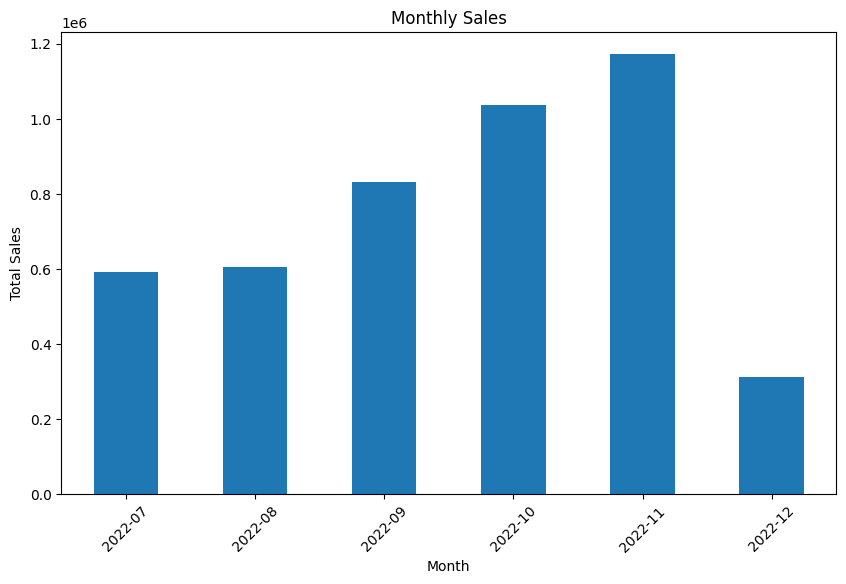

In [ ]:
# Creates a bar plot showing the total sales for each month.
plt.figure(figsize=(10, 6))
data.groupby('YearMonth')['TotalPrice'].sum().plot(kind='bar')
# Adds title and labels to the plot
plt.title('Monthly Sales')
plt.xlabel('Month')
plt.ylabel('Total Sales')
#Rotates x-axis labels for better readability
plt.xticks(rotation=45)
plt.show()

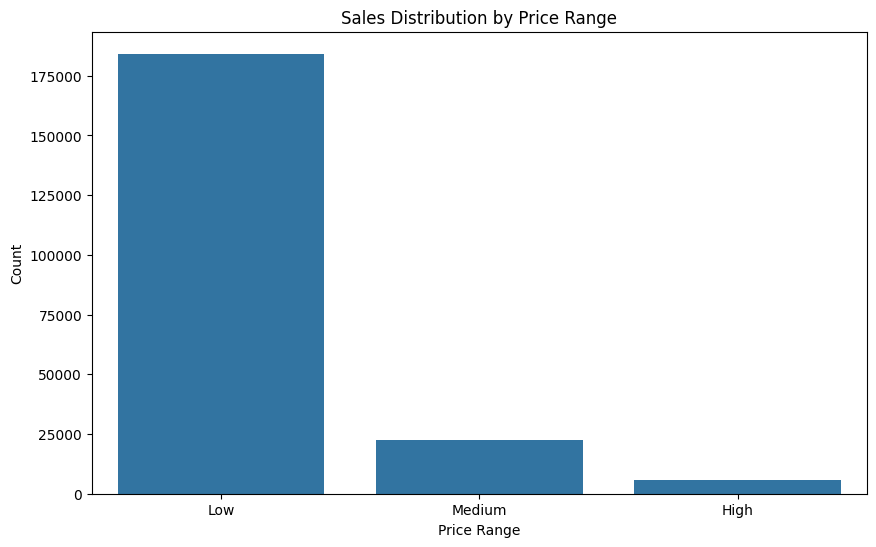

In [ ]:
#Creates a count plot to visualize the distribution of sales by price range.
plt.figure(figsize=(10, 6))
sns.countplot(x='PriceRange', data=data)
# Adds title and labels to the plot
plt.title('Sales Distribution by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Count')
#Displays the plot
plt.show()

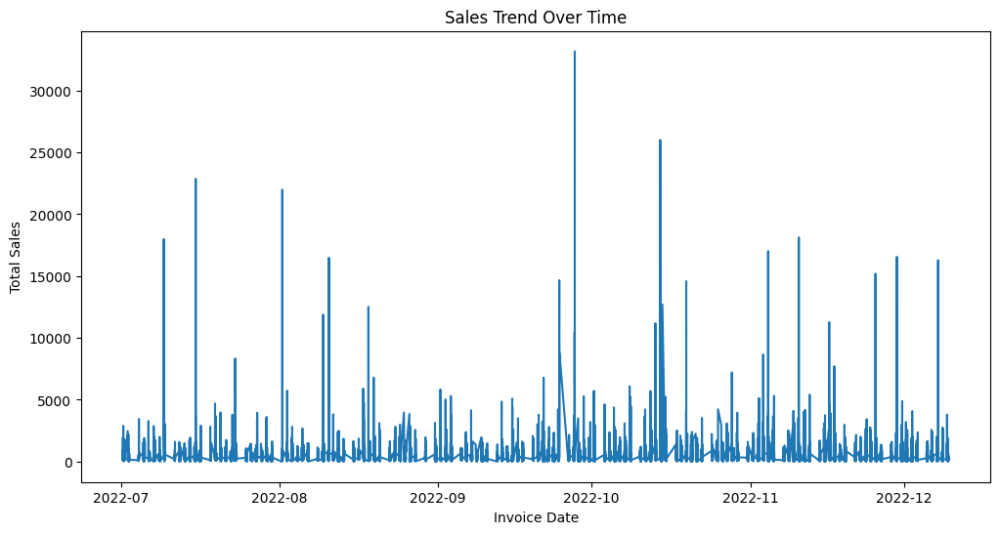

In [ ]:
#Sales Trend Over Time
# Group the data by InvoiceDate and calculate the total sales
sales_trend = data.groupby('InvoiceDate')['TotalPrice'].sum().reset_index()

# Create a line plot to show the sales trend over time
plt.figure(figsize=(12, 6))
sns.lineplot(x='InvoiceDate', y='TotalPrice', data=sales_trend)
plt.title('Sales Trend Over Time')
plt.xlabel('Invoice Date')
plt.ylabel('Total Sales')
plt.show()

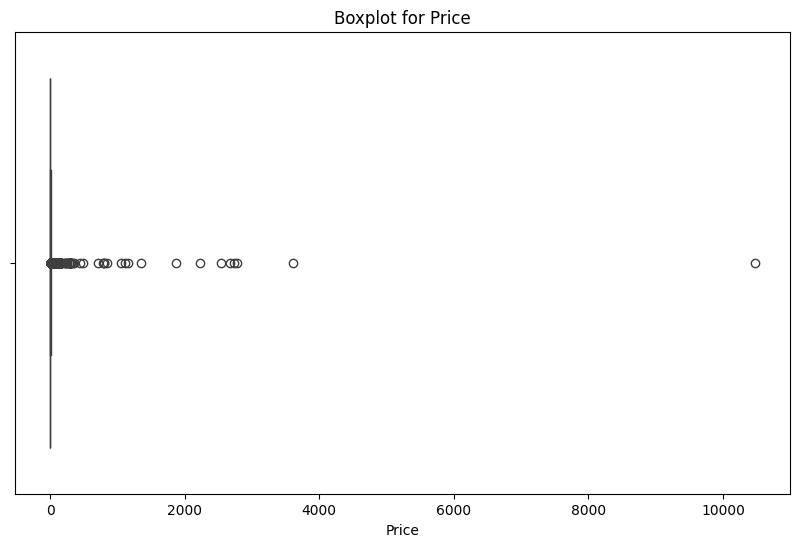

In [ ]:
# Creates a boxplot to visualize the distribution of prices.
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['Price'])
# Adds title to the plot
plt.title('Boxplot for Price')
# Displays the plot
plt.show()


In [ ]:
import plotly.express as px
# Create scatter plot matrix with brushing
fig = px.scatter_matrix(
    data,
    dimensions=["Price", "Quantity", "DayOfWeek"],
    color="Country"
)
fig.update_traces(opacity=0.7)  # Adjust opacity for better overlapping point visualization
fig.show()

Helpful in identifying patterns and trends like how price, quantity sold, and day of the week might be interrelated within different countries.

In [ ]:
profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True)

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file("output.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#Outlier Detection Function
def detect_outliers(df, feature):
    # Calculate the first quartile (Q1)
    Q1 = df[feature].quantile(0.25)
    # Calculate the first quartile (Q3)
    Q3 = df[feature].quantile(0.75)
    # Calculate the interquartile range (IQR)
    IQR = Q3 - Q1
    # Calculate the lower bound
    lower_bound = Q1 - 1.5 * IQR
    # Calculate the upper bound
    upper_bound = Q3 + 1.5 * IQR
    # Return the rows where the feature values are outliers
    return df[(df[feature] < lower_bound) | (df[feature] > upper_bound)]


In [ ]:
#Detect outliers in Quantity
outliers_quantity = detect_outliers(data, 'Quantity')
# Print the number of outliers detected in the 'Quantity' column
print("Number of outliers in Quantity:", len(outliers_quantity))

# Detect outliers in Price
outliers_price = detect_outliers(data, 'Price')
# Print the number of outliers detected in the 'Price' column
print("Number of outliers in Price:", len(outliers_price))

Number of outliers in Quantity: 13318
Number of outliers in Price: 17411


In [ ]:
# Applies a logarithmic transformation to the 'Quantity' column and stores the result in a new column 'LogQuantity'.
# Adding 1 to each value before taking the logarithm avoids undefined results for zero values.
data['LogQuantity'] = np.log(data['Quantity'] + 1) # Adding 1 to avoid log(0)
# Applies a logarithmic transformation to the 'Price' column and stores the result in a new column 'LogPrice'.
# Adding 1 to each value before taking the logarithm avoids undefined results for zero values.
data['LogPrice'] = np.log(data['Price'] + 1)

In [ ]:
# Calculate the 95th percentile of the 'Quantity' column
quantile_95_quantity = data['Quantity'].quantile(0.95)
# Calculate the 95th percentile of the 'Price' column
quantile_95_price = data['Price'].quantile(0.95)
# Create new columns 'CappedQuantity95' and 'CappedPrice95' to cap extreme values at the 95th percentile
# Values exceeding the 95th percentile are replaced with the 95th percentile value
data['CappedQuantity95'] = np.where(data['Quantity'] > quantile_95_quantity, quantile_95_quantity, data['Quantity'])
data['CappedPrice95'] = np.where(data['Price'] > quantile_95_price, quantile_95_price, data['Price'])

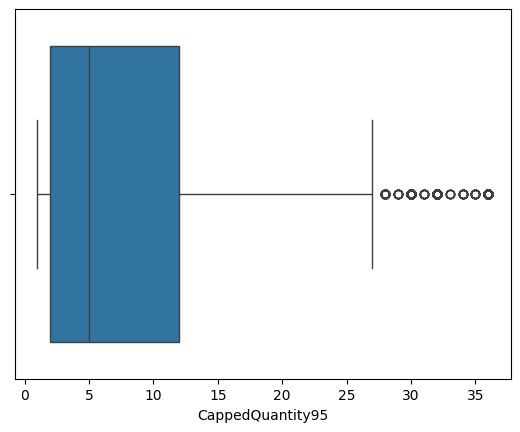

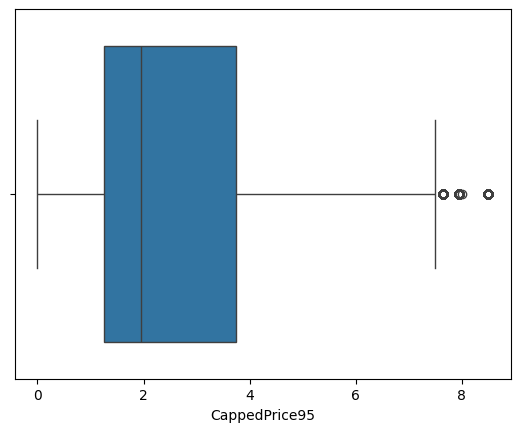

In [ ]:
#Display a boxplot to visualize the distribution of values in the 'CappedQuantity95' column
sns.boxplot(x=data['CappedQuantity95'])
plt.show()
# Display a boxplot to visualize the distribution of values in the 'CappedPrice95' column
sns.boxplot(x=data['CappedPrice95'])
plt.show()

# FEATURE ENGINEERING

In [ ]:
#Define the features to be used for modeling
features = ['Quantity', 'Price', 'Month', 'DayOfWeek', 'CountryRegion', 'PriceRange','DayOfMonth','WeekOfYear']
X = data[features]#Extract the selected features from the dataset
y = data['TotalPrice'] #Extract the target variable

In [ ]:
#List of categorical features requiring one-hot encoding
categorical_features = ['DayOfWeek', 'CountryRegion', 'PriceRange']
# Instantiate a OneHotEncoder object
one_hot_encoder = OneHotEncoder()

In [ ]:
# Create a ColumnTransformer to apply preprocessing steps to different types of features
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', one_hot_encoder, categorical_features) #Apply one-hot encoding to categorical features
    ],
    remainder='passthrough'  # Passthrough numerical features
)

#Apply preprocessing to the feature matrix X
X_processed = preprocessor.fit_transform(X)

# Split the preprocessed data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.2, random_state=42)

#MODEL BUILDING & TRAINING

In [ ]:
#Define a dictionary containing different regression models to be evaluated
models = {
    'Linear Regression': LinearRegression(), #Linear regression model
    'Decision Tree': DecisionTreeRegressor(random_state=42), # Decision tree regression model
    'KNN': KNeighborsRegressor() #K-nearest neighbors regression model
}


In [ ]:
#Dictionary to store the results of model evaluation
results = {}
# Iterate over each model in the dictionary
for name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Predict on the testing set
    y_pred = model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    # Cross-validation
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    cv_rmse = np.sqrt(-cv_scores)

    # Store the results
    results[name] = {
        'RMSE': rmse,
        'CV Mean RMSE': cv_rmse.mean(),
        'CV Std RMSE': cv_rmse.std()
    }

In [ ]:
# Iterate over each model's results in the 'results' dictionary
for model_name, metrics in results.items():
    # Print the model name
    print(f"Model: {model_name}")
    # Print the root mean squared error (RMSE) on the test set
    print(f"  RMSE: {metrics['RMSE']:.2f}")
    # Print the mean RMSE from cross-validation
    print(f"  Cross-Validation Mean RMSE: {metrics['CV Mean RMSE']:.2f}")
    # Print the standard deviation of RMSE from cross-validation
    print(f"  Cross-Validation Std RMSE: {metrics['CV Std RMSE']:.2f}\n")

Model: Linear Regression
  RMSE: 81.15
  Cross-Validation Mean RMSE: 60.80
  Cross-Validation Std RMSE: 6.30

Model: Decision Tree
  RMSE: 66.58
  Cross-Validation Mean RMSE: 14.60
  Cross-Validation Std RMSE: 4.98

Model: KNN
  RMSE: 91.03
  Cross-Validation Mean RMSE: 43.70
  Cross-Validation Std RMSE: 6.13



In [ ]:
# Determine the best model based on the model with the lowest cross-validated mean RMSE
best_model_name = min(results, key=lambda x: results[x]['CV Mean RMSE'])
best_model = models[best_model_name]

print(f"The best model is {best_model_name} with a cross-validated RMSE of {results[best_model_name]['CV Mean RMSE']}.")

The best model is Decision Tree with a cross-validated RMSE of 14.598044282682404.


In [ ]:
#Define the grid of hyperparameters to search over
parameters = {'max_depth': [30, 20, 30], 'min_samples_leaf': [1, 2, 4]}
# Instantiate a DecisionTreeRegressor with a random state for reproducibility
dt = DecisionTreeRegressor(random_state=42)
# Perform grid search cross-validation to find the best hyperparameters
clf = GridSearchCV(dt, parameters, cv=10, scoring='neg_mean_squared_error')
clf.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeRegressor(random_state=42),
             param_grid={'max_depth': [30, 20, 30],
                         'min_samples_leaf': [1, 2, 4]},
             scoring='neg_mean_squared_error')

In [ ]:
# Print the best hyperparameters found by grid search
print("Best parameters:", clf.best_params_)
# Print the reduced RMSE achieved by the model with the best hyperparameters
print("Reduced RMSE:", np.sqrt(-clf.best_score_))

Best parameters: {'max_depth': 30, 'min_samples_leaf': 2}
Reduced RMSE: 14.796491604369576


#MODEL EVALUATION

In [ ]:
# Testing on the test data
# Create a DecisionTreeRegressor with the best hyperparameters found by grid search
optimized_tree = DecisionTreeRegressor(max_depth=20, min_samples_leaf=2, random_state=42)
# Train the optimized decision tree model on the training data
optimized_tree.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=20, min_samples_leaf=2, random_state=42)

In [ ]:
#Predict the target variable on the test data using the optimized decision tree model
y_pred_test = optimized_tree.predict(X_test)

In [ ]:
# Calculate the root mean squared error (RMSE) between the true and predicted values on the test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
# Print the RMSE value for the test set
print(f'Test RMSE: {rmse_test:.2f}')

Test RMSE: 72.02


In [ ]:
#Instantiate a RandomForestRegressor model with 100 decision trees and a random state of 42
rf = RandomForestRegressor(n_estimators=100, random_state=42)

In [ ]:
# Train the RandomForestRegressor model on the training data
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
# Predict the target variable on the test data using the trained RandomForestRegressor model
y_pred_test_rf = rf.predict(X_test)

In [ ]:
# Calculate the root mean squared error (RMSE) between the true and predicted values on the test set for the RandomForestRegressor model
rmse_test_rf = np.sqrt(mean_squared_error(y_test, y_pred_test_rf))
print(f'Random Forest Test RMSE: {rmse_test_rf:.2f}')

Random Forest Test RMSE: 69.19


In [ ]:
unique_countries = data['Country'].unique()

In [ ]:
unique_countries

array(['United Kingdom', 'EIRE', 'France', 'Israel', 'Germany',
       'Netherlands', 'Poland', 'Switzerland', 'Japan', 'Thailand',
       'Denmark', 'Australia', 'Belgium', 'Portugal', 'Unspecified',
       'Finland', 'Lithuania', 'Sweden', 'Spain', 'USA',
       'United Arab Emirates', 'Norway', 'Austria', 'Channel Islands',
       'Nigeria', 'Greece', 'West Indies', 'Malta', 'Cyprus', 'Singapore',
       'Italy', 'Korea', 'Brazil', 'Canada', 'Bahrain', 'Iceland'],
      dtype=object)